In [ ]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 34.5 MB/s eta 0:00:00


In [ ]:
!pip install pytorch-lightning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 802.3/802.3 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 29.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-man

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rasterio
from rasterio.plot import show
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.enums import Resampling
from rasterio.mask import mask
from rasterio.merge import merge

import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

import numpy as np

import os

from shapely.geometry import box

import geopandas as gpd

import random

In [ ]:
gt_data = rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data.tif")

In [ ]:
type(gt_data)

rasterio.io.DatasetReader

In [ ]:
gt_data.meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': 0.0,
 'width': 21424,
 'height': 13572,
 'count': 1,
 'crs': CRS.from_epsg(4326),
 'transform': Affine(8.333333333333333e-05, 0.0, 21.331833333333332,
        0.0, -8.333333333333333e-05, 40.26075)}

In [ ]:
with rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data.tif") as gt:
    band = gt.read(1)

    print(gt.meta)
    print(gt.tags())

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 21424, 'height': 13572, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(8.333333333333333e-05, 0.0, 21.331833333333332,
       0.0, -8.333333333333333e-05, 40.26075)}
{'algorithm_version': 'V2.0.0', 'AREA_OR_POINT': 'Area', 'copyright': 'ESA WorldCover project 2021 / Contains modified Copernicus Sentinel data (2021) processed by ESA WorldCover consortium', 'creation_time': '2022-10-21 07:35:40.236136', 'legend': '10  Tree cover\n20  Shrubland\n30  Grassland\n40  Cropland\n50  Built-up\n60  Bare/sparse vegetation\n70  Snow and ice\n80  Permanent water bodies\n90  Herbaceous wetland\n95  Mangroves\n100 Moss and lichen\n', 'license': 'CC-BY 4.0 - https://creativecommons.org/licenses/by/4.0/', 'product_crs': 'EPSG:4326', 'product_grid': '3x3 degree tiling grid', 'product_tile': 'N39E021', 'product_type': 'LandCover Map', 'product_version': 'V2.0.0', 'reference': 'https://esa-worldcover.org', 'time_end': '2021-12-31T2

In [ ]:
unique, counts = np.unique(band, return_counts=True)
print("Unique values and their counts (in pixels):")
print(dict(zip(unique, counts)))

Unique values and their counts (in pixels):
{10: 114844614, 20: 7448541, 30: 47982258, 40: 64127642, 50: 5384116, 60: 1242573, 80: 49619945, 90: 116839}


In [ ]:
classes = {
    10: 'Tree cover',
    20: 'Shrubland',
    30: 'Grassland',
    40: 'Cropland',
    50: 'Built-up',
    60: 'Bare-sparse vegetation',
    80: 'Permanent water bodies',
    90: 'Herbaceous wetland'
}

Download Sentinel-2 Data from Copernicus

έφτιαξα πολύγωνο στην ιστοσελίδα, για να το εισάγω στο σαιτ του copernicus.

In [ ]:
west_lon = 21.331833333333332
north_lat = 40.26075
width = 21424
height = 13572
lon_scale = 8.333333333333333e-05
lat_scale = -8.333333333333333e-05

east_lon = west_lon + (width * lon_scale)
south_lat = north_lat + (height * lat_scale)

print(f"Bounding Box Coordinates:")
print(f"North Latitude: {north_lat}")
print(f"South Latitude: {south_lat}")
print(f"West Longitude: {west_lon}")
print(f"East Longitude: {east_lon}")

Bounding Box Coordinates:
North Latitude: 40.26075
South Latitude: 39.12975
West Longitude: 21.331833333333332
East Longitude: 23.117166666666666


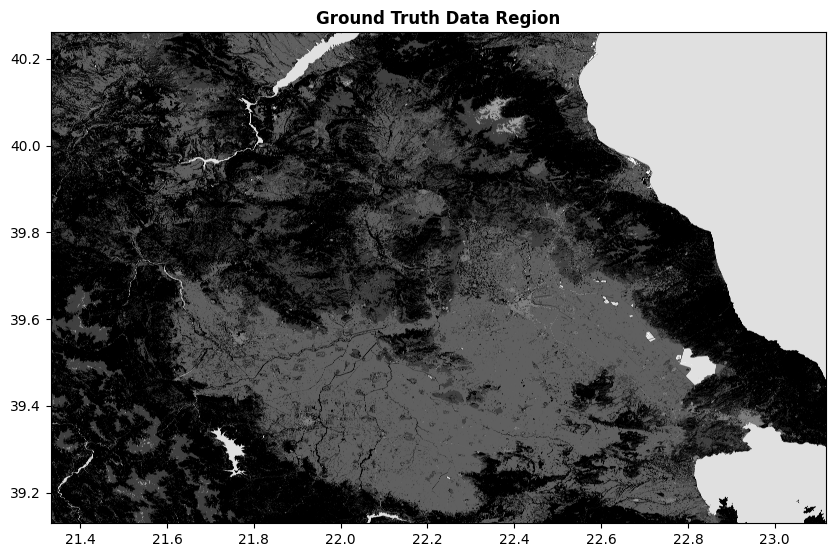

In [ ]:
with rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data.tif") as gt:
    band1 = gt.read(1)

    plt.figure(figsize=(10, 10))
    show(band1, transform=gt.transform, cmap='gray', title="Ground Truth Data Region")
    plt.show()

Από geojson.io βγάζω πολύγωνο με τις παραπάνω συντεταγμένες για να τις βάλω στο copernicus και να πάρω αντίστοιχα data. φίλτρα L1c, <10% νεφοκάλυψη, 01/01/21 - 31/12/2021



*   για το πάνω αριστερά tile -> 05/10/2021
*   για το πάνω δεξιά tile -> 25/09/2021


*   για το κάτω αριστερά tile -> 05/10/2021
*   για το κάτω δεξιά tile -> 05/10/2021





In [ ]:
import zipfile

zip_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEH_20230110T042737.SAFE.zip'
extract_to = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/'

os.makedirs(extract_to, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print("Files extracted successfully!")

Files extracted successfully!


Spatial resolution: (60.0, 60.0)
Coordinate System: EPSG:32634


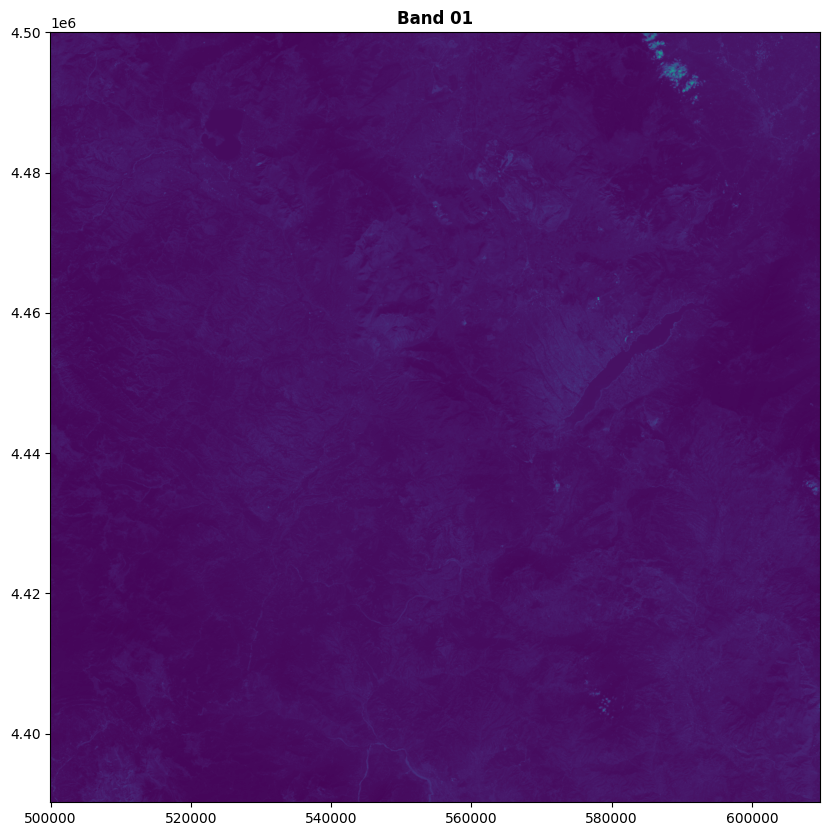

In [ ]:
band_path1 = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/T34TEK_20211005T092031_B01.jp2'

with rasterio.open(band_path1) as b1:

    print("Spatial resolution:", b1.res)
    print("Coordinate System:", b1.crs)

    band = b1.read(1)
    plt.figure(figsize=(10, 10))
    show(band, transform=b1.transform, title='Band 01')
    plt.show()

In [ ]:
with rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data.tif") as src:
    print(src.meta)

with rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data.tif") as src:
    dst_crs = 'EPSG:32634'

    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)

    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    output_path = "/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif"

    with rasterio.open(output_path, 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 21424, 'height': 13572, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(8.333333333333333e-05, 0.0, 21.331833333333332,
       0.0, -8.333333333333333e-05, 40.26075)}


In [ ]:
with rasterio.open(output_path) as new_src:
    print(new_src.meta)

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 19828, 'height': 16348, 'count': 1, 'crs': CRS.from_epsg(32634), 'transform': Affine(7.806462721950723, 0.0, 528217.1864523636,
       0.0, -7.806462721950723, 4458848.812547972)}


In [ ]:
with rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data.tif") as src:

    resolution = src.res  # Returns (pixel width, pixel height)
    print("Spatial resolution:")
    print(f"Pixel width: {resolution[0]} units")
    print(f"Pixel height: {resolution[1]} units")

Spatial resolution:
Pixel width: 8.333333333333333e-05 units
Pixel height: 8.333333333333333e-05 units


In [ ]:
with rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif") as src:
    resolution = src.res
    print("Spatial resolution after reprojection:")
    print(f"Pixel width in meters: {resolution[0]}")
    print(f"Pixel height in meters: {resolution[1]}")

Spatial resolution after reprojection:
Pixel width in meters: 7.806462721950723
Pixel height in meters: 7.806462721950723


In [ ]:
def resample_raster_to_10m_gt(source_path, target_path):
    with rasterio.open(source_path) as src:
        dst_crs = 'EPSG:32634'

        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds,
            resolution=(10.0, 10.0)
        )

        if width <= 0 or height <= 0:
            raise ValueError(f"Invalid dimensions calculated: width={width}, height={height}")

        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height,
            'dtype': src.dtypes[0]
        })

        with rasterio.open(target_path, 'w', **kwargs) as dst:
            for i in range(1, src.count + 1):
                reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.nearest
                )

In [ ]:
resample_raster_to_10m_gt(
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data.tif',
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif'
)

In [ ]:
#check
band_path1 = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif'

with rasterio.open(band_path1) as b1:
    print("Spatial resolution:", b1.res)
    print("Coordinate System:", b1.crs)

Spatial resolution: (10.0, 10.0)
Coordinate System: EPSG:32634


In [ ]:
with rasterio.open(band_path1) as new_src:
    print(new_src.meta)

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 15479, 'height': 12763, 'count': 1, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 528217.1864523636,
       0.0, -10.0, 4458848.812547972)}


Οπότε, από δω και πέρα για τα ground truth δουλεύουμε με το GBDA24_ex2_ref_data_UTM34N.tif. Επίσης, για κάθε tile, μαζεύονται σε φάκελο τα αρχεία καναλιών που είναι 10 x 10 (original και τροποποιημένα).

In [ ]:
def pansharpen(ms_band_path, pan_band_path, output_path):
    with rasterio.open(ms_band_path) as ms, rasterio.open(pan_band_path) as pan:
        ms_data = ms.read(1)
        pan_data = pan.read(1)

        ms_resampled = np.empty_like(pan_data)
        reproject(
            source=ms_data,
            destination=ms_resampled,
            src_transform=ms.transform,
            src_crs=ms.crs,
            dst_transform=pan.transform,
            dst_crs=pan.crs,
            resampling=Resampling.bilinear
        )

        total = ms_resampled + pan_data
        pansharpened = (ms_resampled * pan_data) / total.clip(min=1)

        with rasterio.open(output_path, 'w', driver='JP2OpenJPEG', width=pan.width, height=pan.height, count=1, dtype='uint8', crs=pan.crs, transform=pan.transform) as dst:
          dst.write(pansharpened, 1)

In [ ]:
#TFK_top_right_tile
bands_to_pansharpen = ['B05.jp2', 'B06.jp2', 'B07.jp2', 'B8A.jp2', 'B11.jp2', 'B12.jp2', 'B01.jp2', 'B09.jp2', 'B10.jp2']
pan_band_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20210925T092031_N0500_R093_T34TFK_20230118T233535.SAFE/GRANULE/L1C_T34TFK_A032694_20210925T092343/IMG_DATA/T34TFK_20210925T092031_B08.jp2'

for band_name in bands_to_pansharpen:
    ms_band_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20210925T092031_N0500_R093_T34TFK_20230118T233535.SAFE/GRANULE/L1C_T34TFK_A032694_20210925T092343/IMG_DATA/T34TFK_20210925T092031_{band_name}'
    output_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20210925T092031_N0500_R093_T34TFK_20230118T233535.SAFE/GRANULE/L1C_T34TFK_A032694_20210925T092343/IMG_DATA/T34TFK_20210925T092031_pansharpened_{band_name}'
    pansharpen(ms_band_path, pan_band_path, output_path)

In [ ]:
#SEJ_bottom_left_tile
bands_to_pansharpen = ['B05.jp2', 'B06.jp2', 'B07.jp2', 'B8A.jp2', 'B11.jp2', 'B12.jp2', 'B01.jp2', 'B09.jp2', 'B10.jp2']
pan_band_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEJ_20230110T042737.SAFE/GRANULE/L1C_T34SEJ_A032837_20211005T092344/IMG_DATA/T34SEJ_20211005T092031_B08.jp2'

for band_name in bands_to_pansharpen:
    ms_band_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEJ_20230110T042737.SAFE/GRANULE/L1C_T34SEJ_A032837_20211005T092344/IMG_DATA/T34SEJ_20211005T092031_{band_name}'
    output_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEJ_20230110T042737.SAFE/GRANULE/L1C_T34SEJ_A032837_20211005T092344/IMG_DATA/T34SEJ_20211005T092031_pansharpened_{band_name}'
    pansharpen(ms_band_path, pan_band_path, output_path)

In [ ]:
#SFJ_bottom_right_tile
bands_to_pansharpen = ['B05.jp2', 'B06.jp2', 'B07.jp2', 'B8A.jp2', 'B11.jp2', 'B12.jp2', 'B01.jp2', 'B09.jp2', 'B10.jp2']
pan_band_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SFJ_20230110T042737.SAFE/GRANULE/L1C_T34SFJ_A032837_20211005T092344/IMG_DATA/T34SFJ_20211005T092031_B08.jp2'

for band_name in bands_to_pansharpen:
    ms_band_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SFJ_20230110T042737.SAFE/GRANULE/L1C_T34SFJ_A032837_20211005T092344/IMG_DATA/T34SFJ_20211005T092031_{band_name}'
    output_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SFJ_20230110T042737.SAFE/GRANULE/L1C_T34SFJ_A032837_20211005T092344/IMG_DATA/T34SFJ_20211005T092031_pansharpened_{band_name}'
    pansharpen(ms_band_path, pan_band_path, output_path)

In [ ]:
#TEK_top_left_tile
bands_to_pansharpen = ['B05.jp2', 'B06.jp2', 'B07.jp2', 'B8A.jp2', 'B11.jp2', 'B12.jp2', 'B01.jp2', 'B09.jp2', 'B10.jp2']
pan_band_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/T34TEK_20211005T092031_B08.jp2'

for band_name in bands_to_pansharpen:
    ms_band_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/T34TEK_20211005T092031_{band_name}'
    output_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/T34TEK_20211005T092031_pansharpened_{band_name}'
    pansharpen(ms_band_path, pan_band_path, output_path)

In [ ]:
#check
band_path1 = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/Final/T34TEK_20211005T092031_pansharpened_B05.jp2'

with rasterio.open(band_path1) as b1:
    print("Spatial resolution:", b1.res)
    print("Coordinate System:", b1.crs)

Spatial resolution: (10.0, 10.0)
Coordinate System: EPSG:32634


In [ ]:
def plot_raster(path, title, ax, cmap='viridis'):
    with rasterio.open(path) as src:
        data = src.read(1)

        transform = src.transform
        norm = Normalize(vmin=data.min(), vmax=data.max())
        img = ax.imshow(data, cmap=cmap, norm=norm, extent=[transform[2], transform[2] + transform[0] * data.shape[1], transform[5] + transform[4] * data.shape[0], transform[5]], origin='upper')
        ax.figure.colorbar(img, ax=ax, orientation='vertical', fraction=0.036, pad=0.04)
        ax.title.set_text(title)
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.grid(True)
        ax.set_xticks([], minor=True)
        ax.set_yticks([], minor=True)

In [ ]:
def crop_all_bands(tile_directory, match_path, output_directory):
    os.makedirs(output_directory, exist_ok=True)
    band_files = [f for f in os.listdir(tile_directory) if f.endswith('.jp2')]

    with rasterio.open(match_path) as match:
        bbox = box(*match.bounds)
        geojson = gpd.GeoDataFrame([{'geometry': bbox}], crs=match.crs).geometry.__geo_interface__['features'][0]['geometry']

        for band_file in band_files:
            band_path = os.path.join(tile_directory, band_file)
            output_path = os.path.join(output_directory, f"cropped_{band_file}")

            with rasterio.open(band_path) as base:
                out_image, out_transform = mask(base, [geojson], crop=True)
                out_meta = base.meta.copy()
                out_meta.update({
                    "driver": "GTiff",
                    "height": out_image.shape[1],
                    "width": out_image.shape[2],
                    "transform": out_transform
                })

                with rasterio.open(output_path, 'w', **out_meta) as out_raster:
                    out_raster.write(out_image)

In [ ]:
#SFJ_bottom_right_tile
tile_directory = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SFJ_20230110T042737.SAFE/GRANULE/L1C_T34SFJ_A032837_20211005T092344/IMG_DATA/Final'
ground_truth_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif'
output_directory = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SFJ_20230110T042737.SAFE/GRANULE/L1C_T34SFJ_A032837_20211005T092344/IMG_DATA/Cropped'
crop_all_bands(tile_directory, ground_truth_path, output_directory)

In [ ]:
#TEK_top_left_tile
tile_directory = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/Final'
ground_truth_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif'
output_directory = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/Cropped'
crop_all_bands(tile_directory, ground_truth_path, output_directory)

In [ ]:
#SEJ_bottom_left_tile
tile_directory = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEJ_20230110T042737.SAFE/GRANULE/L1C_T34SEJ_A032837_20211005T092344/IMG_DATA/Final'
ground_truth_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif'
output_directory = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEJ_20230110T042737.SAFE/GRANULE/L1C_T34SEJ_A032837_20211005T092344/IMG_DATA/Cropped'
crop_all_bands(tile_directory, ground_truth_path, output_directory)

In [ ]:
#TFK_top_right_tile
tile_directory = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20210925T092031_N0500_R093_T34TFK_20230118T233535.SAFE/GRANULE/L1C_T34TFK_A032694_20210925T092343/IMG_DATA/Final'
ground_truth_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif'
output_directory = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20210925T092031_N0500_R093_T34TFK_20230118T233535.SAFE/GRANULE/L1C_T34TFK_A032694_20210925T092343/IMG_DATA/Cropped'
crop_all_bands(tile_directory, ground_truth_path, output_directory)

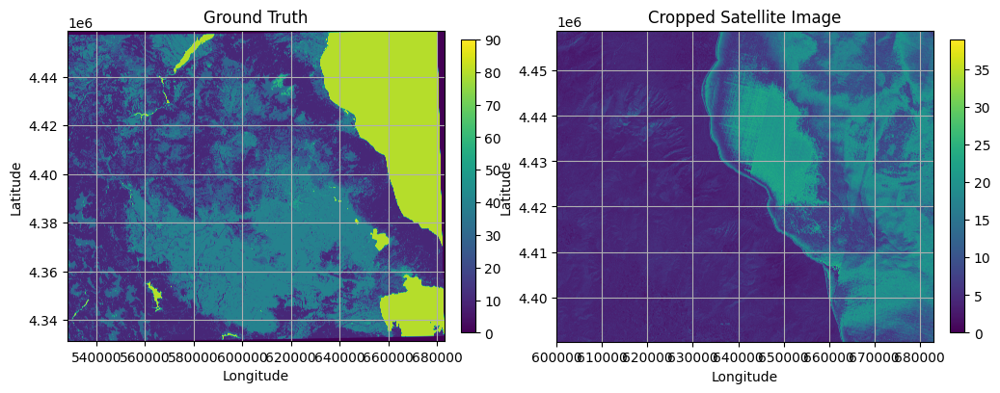

In [ ]:
#Plot_TFK
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
plot_raster('/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif', 'Ground Truth', ax1)
plot_raster('/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20210925T092031_N0500_R093_T34TFK_20230118T233535.SAFE/GRANULE/L1C_T34TFK_A032694_20210925T092343/IMG_DATA/Cropped/cropped_T34TFK_20210925T092031_B8A.jp2', 'Cropped Satellite Image', ax2)
plt.show()

In [ ]:
#TEK_top_left_tile
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
plot_raster('/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif', 'Ground Truth', ax1)
plot_raster('/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/Cropped/cropped_T34TEK_20211005T092031_B8A.jp2', 'Cropped Satellite Image', ax2)
plt.show()

Δεν είναι παρουσιάσιμα, απλά έγιναν για να βεβαιωθώ ότι ταιριάζουν οι συντεταγμένες.

In [ ]:
def create_multiband_tiff(output_path, tile_directory_base, filename_template):
    band_order = ['B01.jp2', 'B02.jp2', 'B03.jp2', 'B04.jp2', 'B05.jp2', 'B06.jp2', 'B07.jp2', 'B08.jp2', 'B8A.jp2', 'B09.jp2', 'B10.jp2', 'B11.jp2', 'B12.jp2']

    band_paths = [os.path.join(tile_directory_base, filename_template.format(band=band)) for band in band_order]

    src_files_to_mosaic = [rasterio.open(bp) for bp in band_paths if os.path.exists(bp)]

    if len(src_files_to_mosaic) != len(band_order):
        raise ValueError("Some band files are missing or the names do not match the expected pattern.")

    with rasterio.open(
        output_path, 'w', driver='GTiff',
        height=src_files_to_mosaic[0].height, width=src_files_to_mosaic[0].width,
        count=len(src_files_to_mosaic), crs=src_files_to_mosaic[0].crs,
        dtype=src_files_to_mosaic[0].dtypes[0], transform=src_files_to_mosaic[0].transform
    ) as dst:
        for idx, src in enumerate(src_files_to_mosaic, start=1):
            dst.write(src.read(1), idx)
            src.close()

In [ ]:
#Multiband13_tiff_SFJ
tile_directory_base = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SFJ_20230110T042737.SAFE/GRANULE/L1C_T34SFJ_A032837_20211005T092344/IMG_DATA/Cropped'
filename_template = 'cropped_T34SFJ_20211005T092031_{band}'
output_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SFJ_multiband13.tif'
create_multiband_tiff(output_path, tile_directory_base, filename_template)

In [ ]:
tiff_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SFJ_multiband13.tif'

with rasterio.open(tiff_path) as src:
    print("Number of bands:", src.count)
    print("Coordinate Reference System (CRS):", src.crs)
    print("Dimensions:", src.width, "x", src.height)
    print("Bounds:", src.bounds)
    print("Resolution:", src.res)
    print("Transform:", src.transform)
    print("Data type of the first band:", src.dtypes[0])

    for i in range(1, src.count + 1):
        band_metadata = src.tags(i)
        print(f"Metadata for band {i}: {band_metadata}")

Number of bands: 13
Coordinate Reference System (CRS): EPSG:32634
Dimensions: 8301 x 6883
Bounds: BoundingBox(left=600000.0, bottom=4331210.0, right=683010.0, top=4400040.0)
Resolution: (10.0, 10.0)
Transform: | 10.00, 0.00, 600000.00|
| 0.00,-10.00, 4400040.00|
| 0.00, 0.00, 1.00|
Data type of the first band: uint8
Metadata for band 1: {}
Metadata for band 2: {}
Metadata for band 3: {}
Metadata for band 4: {}
Metadata for band 5: {}
Metadata for band 6: {}
Metadata for band 7: {}
Metadata for band 8: {}
Metadata for band 9: {}
Metadata for band 10: {}
Metadata for band 11: {}
Metadata for band 12: {}
Metadata for band 13: {}


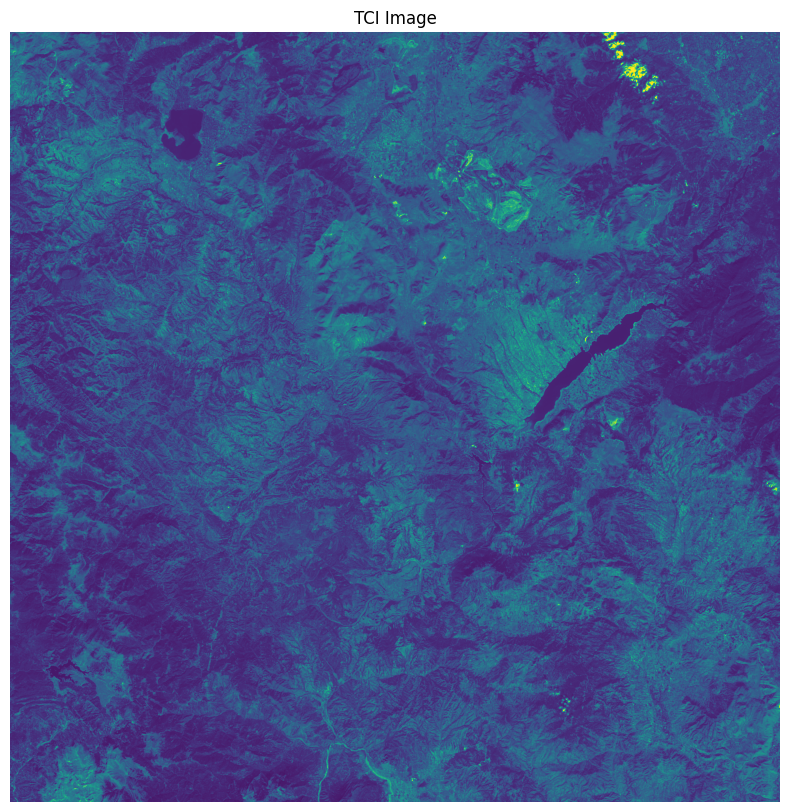

In [ ]:
#check plot TCI

def plot_rgb_image(image_path):
    with rasterio.open(image_path) as src:
        band = src.read(1)

        plt.figure(figsize=(10, 10))
        plt.imshow(band)
        plt.title('TCI Image')
        plt.xlabel('Pixel Column')
        plt.ylabel('Pixel Row')
        plt.axis('off')
        plt.show()

image_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/T34TEK_20211005T092031_TCI.jp2'
plot_rgb_image(image_path)

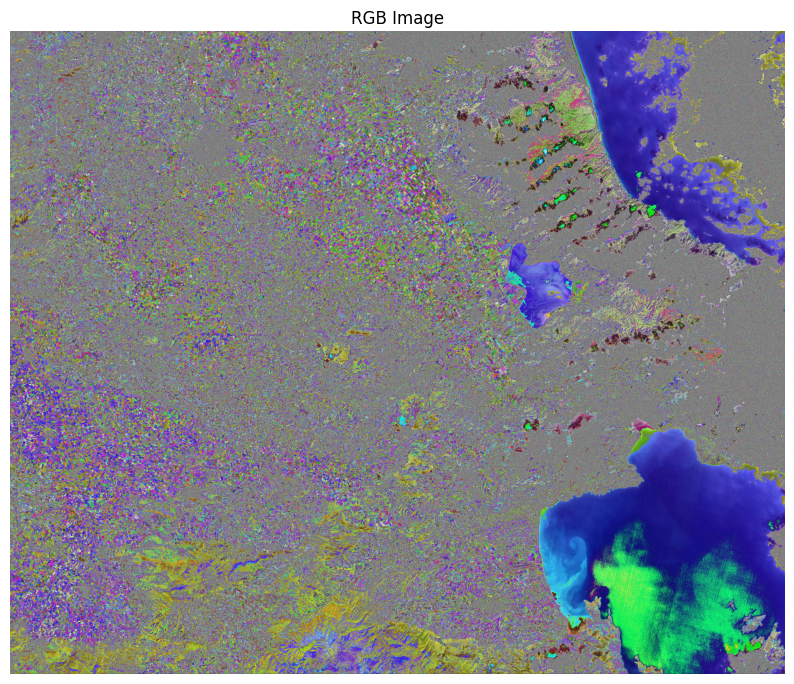

In [ ]:
def plot_rgb_image(image_path):
    with rasterio.open(image_path) as src:
        red = src.read(4)
        green = src.read(3)
        blue = src.read(2)

        red = red / np.max(red)
        green = green / np.max(green)
        blue = blue / np.max(blue)

        rgb = np.dstack((red, green, blue))

        plt.figure(figsize=(10, 10))
        plt.imshow(rgb)
        plt.title('RGB Image')
        plt.xlabel('Pixel Column')
        plt.ylabel('Pixel Row')
        plt.axis('off')
        plt.show()

image_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SFJ_multiband13.tif'
plot_rgb_image(image_path)

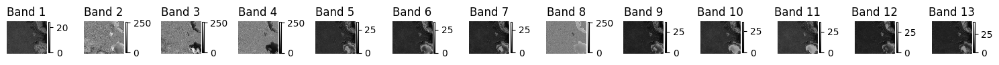

In [ ]:
def plot_all_bands(image_path):
    with rasterio.open(image_path) as src:
        num_bands = src.count
        fig, axs = plt.subplots(1, num_bands, figsize=(15, 5))

        for i in range(1, num_bands + 1):
            band_data = src.read(i)

            ax = axs[i-1] if num_bands > 1 else axs
            im = ax.imshow(band_data, cmap='gray')
            ax.title.set_text(f'Band {i}')
            ax.axis('off')
            fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.036, pad=0.04)

        plt.tight_layout()
        plt.show()

image_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SFJ_multiband13.tif'
plot_all_bands(image_path)

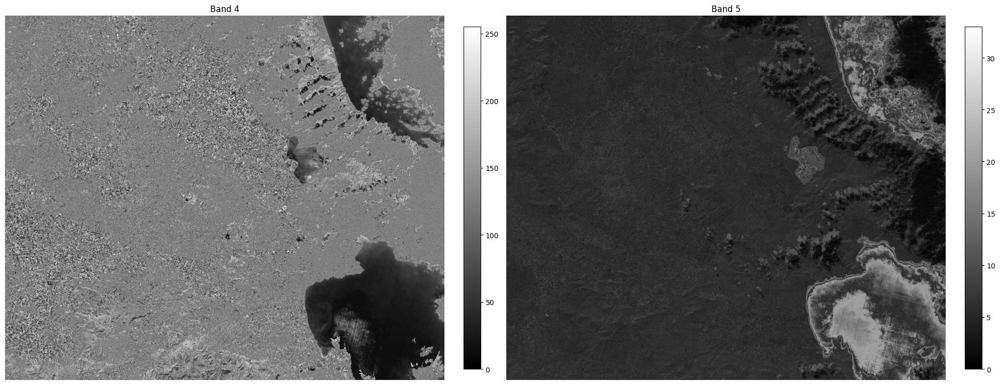

In [ ]:
def plot_specific_bands(image_path, band_numbers):
    with rasterio.open(image_path) as src:
        fig, axs = plt.subplots(1, len(band_numbers), figsize=(10 * len(band_numbers), 10))

        for i, band_number in enumerate(band_numbers):
            band_data = src.read(band_number)

            ax = axs[i] if len(band_numbers) > 1 else axs
            im = ax.imshow(band_data, cmap='gray')
            ax.title.set_text(f'Band {band_number}')
            ax.axis('off')
            fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.036, pad=0.04)

        plt.tight_layout()
        plt.show()

image_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SFJ_multiband13.tif'

plot_specific_bands(image_path, [4, 5])

In [ ]:
#Multiband13_tiff_SEJ
tile_directory_base = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEJ_20230110T042737.SAFE/GRANULE/L1C_T34SEJ_A032837_20211005T092344/IMG_DATA/Cropped'
filename_template = 'cropped_T34SEJ_20211005T092031_{band}'
output_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SEJ_multiband13.tif'
create_multiband_tiff(output_path, tile_directory_base, filename_template)

In [ ]:
#Multiband13_tiff_TEK
tile_directory_base = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34TEK_20230110T042737.SAFE/GRANULE/L1C_T34TEK_A032837_20211005T092344/IMG_DATA/Cropped'
filename_template = 'cropped_T34TEK_20211005T092031_{band}'
output_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TEK_multiband13.tif'
create_multiband_tiff(output_path, tile_directory_base, filename_template)

In [ ]:
#Multiband13_tiff_TFK
tile_directory_base = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20210925T092031_N0500_R093_T34TFK_20230118T233535.SAFE/GRANULE/L1C_T34TFK_A032694_20210925T092343/IMG_DATA/Cropped'
filename_template = 'cropped_T34TFK_20210925T092031_{band}'
output_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TFK_multiband13.tif'
create_multiband_tiff(output_path, tile_directory_base, filename_template)

In [ ]:
def add_ground_truth_to_data(data_tif_path, ground_truth_path, output_path):
    with rasterio.open(ground_truth_path) as gt:
        gt_band = gt.read(1)

        with rasterio.open(data_tif_path) as data:
            data_bounds = data.bounds
            geometry = box(data_bounds.left, data_bounds.bottom, data_bounds.right, data_bounds.top)
            geojson = gpd.GeoDataFrame({'geometry': [geometry]}, crs=data.crs).to_json()

            gt_cropped, gt_transform = mask(dataset=gt, shapes=[geometry], crop=True)
            gt_cropped = gt_cropped[0]

            if gt_cropped.shape != (data.height, data.width):
                raise ValueError("The shapes do not match, ensure alignment and CRS are identical.")

            profile = data.profile
            profile.update(count=data.count + 1)

            with rasterio.open(output_path, 'w', **profile) as dst:
                for i in range(1, data.count + 1):
                    dst.write(data.read(i), i)
                dst.write(gt_cropped, data.count + 1)

In [ ]:
data_tif_paths = [
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TEK_multiband13.tif',
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TFK_multiband13.tif',
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SFJ_multiband13.tif',
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SEJ_multiband13.tif'
]
ground_truth_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data_UTM34N.tif'

for data_tif_path in data_tif_paths:
    base_path = '/'.join(data_tif_path.split('/')[:-1]) + '/'

    file_prefix = data_tif_path[-19:-16]
    new_file_name = file_prefix + '_multiband14.tif'
    output_path = base_path + new_file_name
    add_ground_truth_to_data(data_tif_path, ground_truth_path, output_path)

In [ ]:
def check_tiff_metadata(file_path):
    with rasterio.open(file_path) as src:
        print("Number of bands:", src.count)
        print("Metadata for the last band:")
        print(src.tags(src.count))

        print("CRS:", src.crs)
        print("Transform:", src.transform)
        print("Width:", src.width, "Height:", src.height)

In [ ]:
file_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TFK_multiband14.tif'
check_tiff_metadata(file_path)

Number of bands: 14
Metadata for the last band:
{}
CRS: EPSG:32634
Transform: | 10.00, 0.00, 600000.00|
| 0.00,-10.00, 4458850.00|
| 0.00, 0.00, 1.00|
Width: 8301 Height: 6865


In [ ]:
def analyze_band_classes(tiff_path, band_number):
    with rasterio.open(tiff_path) as src:
        if band_number > src.count:
            raise ValueError("Band number exceeds the number of bands in the raster.")

        band = src.read(band_number)
        unique, counts = np.unique(band, return_counts=True)

        print(f"Metadata for band {band_number}:")
        print(src.meta)
        print(src.tags(band_number))

        print("Unique values and their counts (in pixels):")
        print(dict(zip(unique, counts)))

In [ ]:
tiff_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TEK_multiband14.tif'
analyze_band_classes(tiff_path, 14)

Metadata for band 14:
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 8157, 'height': 6865, 'count': 14, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 528210.0,
       0.0, -10.0, 4458850.0)}
{}
Unique values and their counts (in pixels):
{0: 1555417, 10: 30349991, 20: 1332394, 30: 13565485, 40: 7585548, 50: 721237, 60: 209432, 80: 678069, 90: 232}


In [ ]:
def print_pixel_info(tiff_path_multi, tiff_path_single):
    with rasterio.open(tiff_path_multi) as src_multi:
        band_multi = src_multi.read(src_multi.count)
        total_pixels_multi = band_multi.size
        unique_multi, counts_multi = np.unique(band_multi, return_counts=True)

        print(f"Total number of pixels in the last band of multi-band TIFF: {total_pixels_multi}")
        print(f"Unique pixel values and counts in the last band: {dict(zip(unique_multi, counts_multi))}")

    with rasterio.open(tiff_path_single) as src_single:
        band_single = src_single.read(1)
        total_pixels_single = band_single.size
        unique_single, counts_single = np.unique(band_single, return_counts=True)

        print(f"Total number of pixels in the ground truth file: {total_pixels_single}")
        print(f"Unique pixel values and counts in the ground truth file: {dict(zip(unique_single, counts_single))}")

In [ ]:
tiff_path_multi = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TEK_multiband14.tif'
tiff_path_single = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_ref_data.tif'
print_pixel_info(tiff_path_multi, tiff_path_single)

Total number of pixels in the last band of multi-band TIFF: 55997805
Unique pixel values and counts in the last band: {0: 1555417, 10: 30349991, 20: 1332394, 30: 13565485, 40: 7585548, 50: 721237, 60: 209432, 80: 678069, 90: 232}
Total number of pixels in the ground truth file: 290766528
Unique pixel values and counts in the ground truth file: {10: 114844614, 20: 7448541, 30: 47982258, 40: 64127642, 50: 5384116, 60: 1242573, 80: 49619945, 90: 116839}


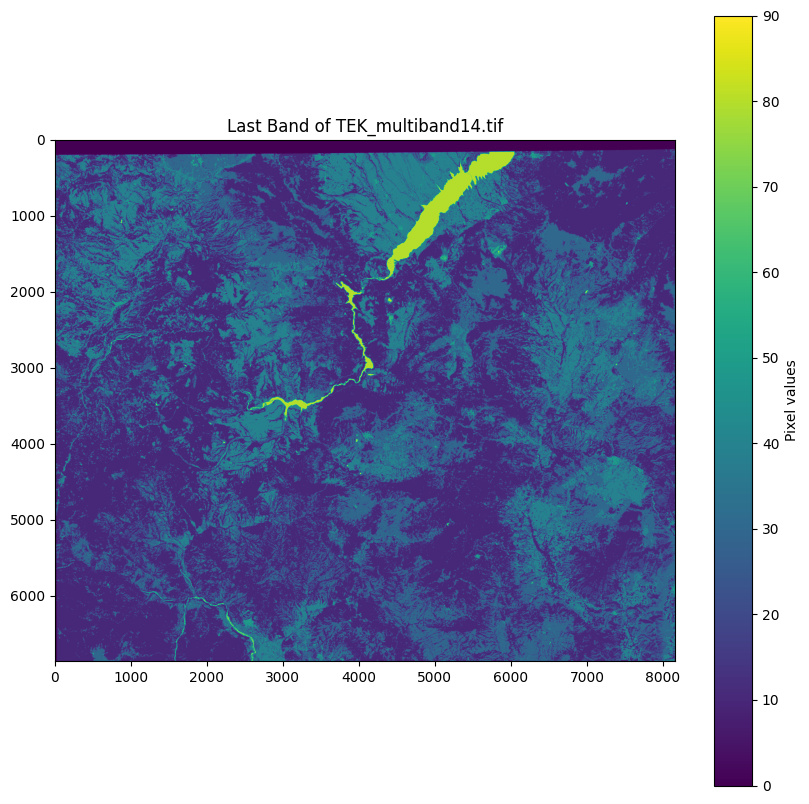

In [ ]:
def plot_last_band(tiff_path):
    with rasterio.open(tiff_path) as src:
        last_band = src.read(src.count)

        plt.figure(figsize=(10, 10))
        plt.title(f'Last Band of {tiff_path.split("/")[-1]}')
        plt.imshow(last_band, cmap='viridis')
        plt.colorbar(label='Pixel values')
        plt.show()

tiff_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TEK_multiband14.tif'
plot_last_band(tiff_path)

Ένωση των 4 tifs σε ένα, διώχνοντας τα overlaps.

In [ ]:
tiff_paths = [
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TEK_multiband14.tif',
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/TFK_multiband14.tif',
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SEJ_multiband14.tif',
    '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/SFJ_multiband14.tif'
]

src_files_to_merge = [rasterio.open(fp) for fp in tiff_paths]
merged_raster, merged_transform = merge(src_files_to_merge)

output_fp = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/merged.tif'
with rasterio.open(
    output_fp, 'w', driver='GTiff',
    height=merged_raster.shape[1], width=merged_raster.shape[2],
    count=len(src_files_to_merge[0].indexes), dtype=src_files_to_merge[0].dtypes[0],
    crs=src_files_to_merge[0].crs, transform=merged_transform
) as dst:
    dst.write(merged_raster)

for src in src_files_to_merge:
    src.close()

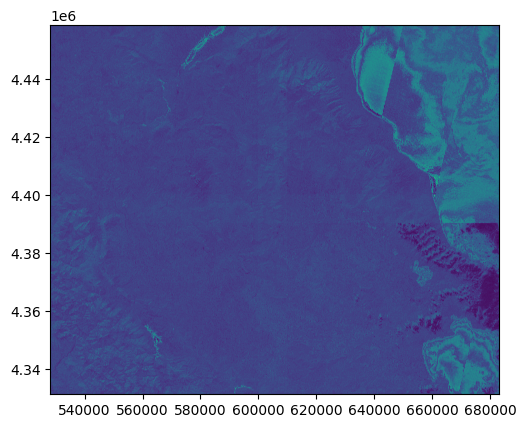

In [ ]:
with rasterio.open(output_fp) as merged_src:
    show(merged_src, cmap='viridis')

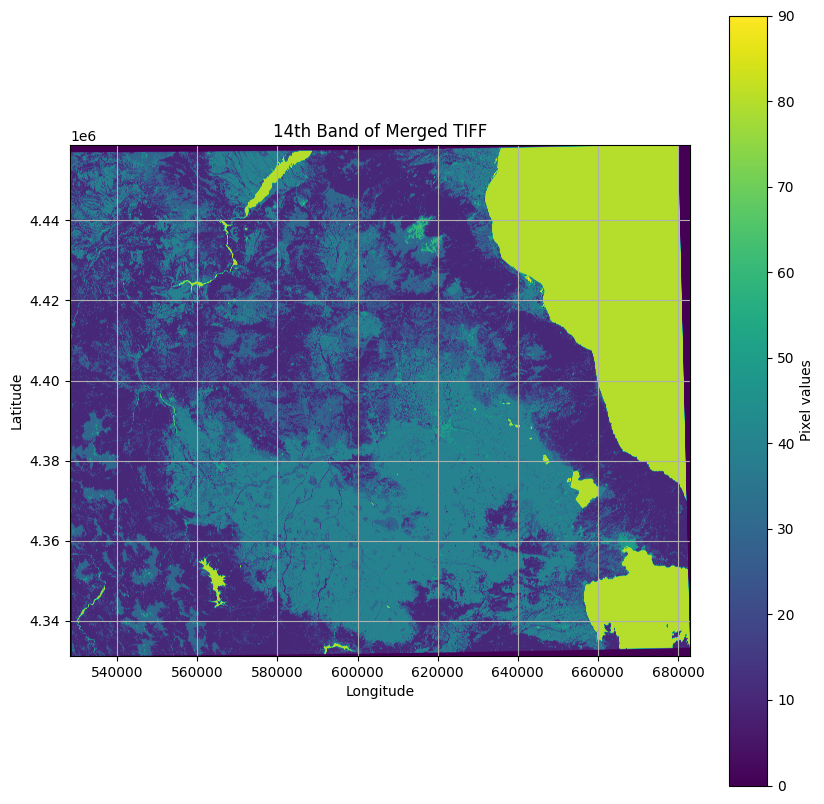

In [ ]:
file_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/merged.tif'

with rasterio.open(file_path) as src:
    band14 = src.read(14)

    transform = src.transform
    extent = [
        transform[2],
        transform[2] + transform[0] * src.width,
        transform[5] + transform[4] * src.height,
        transform[5]
    ]

    plt.figure(figsize=(10, 10))
    plt.title('14th Band of Merged TIFF')
    plt.imshow(band14, cmap='viridis', extent=extent, origin='upper')  # origin might be 'upper' or 'lower' based on your data orientation
    plt.colorbar(label='Pixel values')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True)
    plt.show()

In [ ]:
def inspect_sample_patches(image_path, patch_size=256, num_samples=5):
    with rasterio.open(image_path) as src:
        n_patches_one_dim = src.width // patch_size
        total_patches = n_patches_one_dim * (src.height // patch_size)

        sample_indices = random.sample(range(total_patches), num_samples)

        for idx in sample_indices:
            row = (idx // n_patches_one_dim) * patch_size
            col = (idx % n_patches_one_dim) * patch_size
            window = rasterio.windows.Window(col, row, patch_size, patch_size)
            patch = src.read(window=window).astype(np.float32)

            print(f"Patch index: {idx}")
            print(f"Patch original data range per band: {[patch[i].min(), patch[i].max()] for i in range(patch.shape[0])}")

            patch /= 10000
            print(f"Patch normalized data range per band: {[patch[i].min(), patch[i].max()] for i in range(patch.shape[0])}")
            print('-' * 50)

image_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/merged.tif'
inspect_sample_patches(image_path)

Patch index: 468
Patch original data range per band: <generator object inspect_sample_patches.<locals>.<genexpr> at 0x793922894ac0>
Patch normalized data range per band: <generator object inspect_sample_patches.<locals>.<genexpr> at 0x793922894ac0>
--------------------------------------------------
Patch index: 1604
Patch original data range per band: <generator object inspect_sample_patches.<locals>.<genexpr> at 0x793922894a50>
Patch normalized data range per band: <generator object inspect_sample_patches.<locals>.<genexpr> at 0x793922894a50>
--------------------------------------------------
Patch index: 2759
Patch original data range per band: <generator object inspect_sample_patches.<locals>.<genexpr> at 0x793922894ac0>
Patch normalized data range per band: <generator object inspect_sample_patches.<locals>.<genexpr> at 0x793922894ac0>
--------------------------------------------------
Patch index: 2142
Patch original data range per band: <generator object inspect_sample_patches.<lo

**Προετοιμασία Δεδομένων για εκπαίδευση**

In [ ]:
with rasterio.open('/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/merged.tif') as src:
    features = src.read(list(range(1, 14)))
    labels = src.read(14)

In [ ]:
unique, counts = np.unique(labels, return_counts=True)
print("Unique label values and their counts:", dict(zip(unique, counts)))

Unique label values and their counts: {0: 5360555, 10: 75923066, 20: 4932782, 30: 31708643, 40: 42465292, 50: 3561554, 60: 821240, 80: 32736435, 90: 77153}


In [ ]:
from torch.utils.data import Dataset, DataLoader, random_split
import torch

from torch import nn
import torchvision

import random

from skimage.transform import rotate
from skimage.util import random_noise

import pytorch_lightning as pl
import torch.nn.functional as F
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
import torchmetrics
import torchvision.models as models
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models import ResNet50_Weights
from pytorch_lightning.loggers import TensorBoardLogger

from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

In [ ]:
tb_logs_path = "/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/tb_logs/my_model_lr_5e-3"
os.makedirs(tb_logs_path, exist_ok=True)

logger = TensorBoardLogger(tb_logs_path)

In [ ]:
def random_rotate_image(image):
    angles = [0, 90, 180, 270]
    angle = random.choice(angles)
    return rotate(image, angle, mode='wrap')

def add_random_noise(image):
    return random_noise(image, mode='gaussian')

In [ ]:
class_label_mapping = {
    0: 0,
    10: 1,
    20: 2,
    30: 3,
    40: 4,
    50: 5,
    60: 6,
    80: 7,
    90: 8
}

class Sent(Dataset):
    def __init__(self, image_path, patch_size=256, transform=None, augment=False):
        super().__init__()
        self.image_path = image_path
        self.patch_size = patch_size
        self.transform = transform
        self.augment = augment
        self.dataset = rasterio.open(image_path)
        self.length = (self.dataset.width // patch_size) * (self.dataset.height // patch_size)

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        n_patches_one_dim = self.dataset.width // self.patch_size
        row = (idx // n_patches_one_dim) * self.patch_size
        col = (idx % n_patches_one_dim) * self.patch_size
        window = rasterio.windows.Window(col, row, self.patch_size, self.patch_size)
        features = self.dataset.read(window=window).astype(np.float32)
        label = features[-1, :, :].astype(np.uint8)
        features = features[:-1, :, :]
        features /= 10000

        if self.augment:
            features = np.array([random_rotate_image(feature) for feature in features])
            features = np.array([add_random_noise(feature) for feature in features])

        if self.transform:
            features, label = self.transform(features, label)

        label_mapped = np.vectorize(class_label_mapping.get)(label)
        label = torch.tensor(label).long()

        return features, label_mapped

In [ ]:
image_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/merged_final.tif'
dset = Sent(image_path, patch_size=256)
dloader = DataLoader(dset, batch_size=32, shuffle=False)
print(len(dset))

data, label = dset[2000] #check
print(data.shape, label.shape, label)
print(type(data))
print(type(label))

train_dset, val_dset = random_split(dset, [0.7,0.3], torch.Generator().manual_seed(23))

train_dloader = DataLoader(train_dset, batch_size = 32, shuffle=True)
val_dloader = DataLoader(val_dset, batch_size = 32, shuffle=True)

for batch in dloader:
    data ,label = batch
    print(data.shape, label.shape)
    print(type(data))

    break

2940
(13, 256, 256) (256, 256) [[4 4 4 ... 4 2 5]
 [4 4 4 ... 4 4 5]
 [4 4 4 ... 4 4 5]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
torch.Size([32, 13, 256, 256]) torch.Size([32, 256, 256])
<class 'torch.Tensor'>


In [ ]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

In [ ]:
class ResNetUNet(nn.Module):
    def __init__(self, n_class, pretrained_path=None, backbone='resnet50', bands='all', linear=False, freeze_backbone=False):
        super().__init__()

        if backbone == 'resnet50':
            base_model = models.resnet50(pretrained=False)
            base_model.fc = nn.Linear(2048, n_class)
        elif backbone == 'resnet18':
            base_model = models.resnet18(pretrained=False)
            base_model.fc = nn.Linear(512, n_class)

        if bands == 'all':
            base_model.conv1 = nn.Conv2d(13, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

        if pretrained_path and os.path.isfile(pretrained_path):
            print(f"Loading checkpoint '{pretrained_path}'")
            checkpoint = torch.load(pretrained_path, map_location="cpu")

            state_dict = checkpoint['state_dict']
            for k in list(state_dict.keys()):
                if k.startswith('module.encoder_q') and not k.startswith('module.encoder_q.fc'):
                    state_dict[k[len("module.encoder_q."):]] = state_dict[k]
                del state_dict[k]

            msg = base_model.load_state_dict(state_dict, strict=False)
            assert set(msg.missing_keys) == {"fc.weight", "fc.bias"}
            print("Loaded pretrained weights!")
        else: print('FAIL')

        if linear:
            for name, param in base_model.named_parameters():
                if name not in ['fc.weight', 'fc.bias']:
                    param.requires_grad = False
            base_model.fc.weight.data.normal_(mean=0.0, std=0.01)
            base_model.fc.bias.data.zero_()

        if freeze_backbone:
            for param in base_model.parameters():
                param.requires_grad = False
            for param in base_model.fc.parameters():
                param.requires_grad = True

        self.base_layers = list(base_model.children())[:-2]

        # Encoder layers
        self.layer1 = nn.Sequential(*self.base_layers[:3])
        self.layer2 = nn.Sequential(*self.base_layers[3:5])
        self.layer3 = self.base_layers[5]
        self.layer4 = self.base_layers[6]
        self.layer5 = self.base_layers[7]

        # Decoder
        self.upconv4 = nn.ConvTranspose2d(2048, 1024, kernel_size=2, stride=2)
        self.decoder4 = DoubleConv(2048, 1024)

        self.upconv3 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder3 = DoubleConv(1024, 512)

        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder2 = DoubleConv(512, 256)
        self.upconv1 = nn.ConvTranspose2d(256, 64, kernel_size=2, stride=2)

        self.decoder1 = DoubleConv(128, 64)
        self.final_upsample = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2)

        self.classifier = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        # Encoder
        #print("Input:", x.shape)
        x1 = self.layer1(x); #print("Layer1:", x1.shape)
        x2 = self.layer2(x1); #print("Layer2:", x2.shape)
        x3 = self.layer3(x2); #print("Layer3:", x3.shape)
        x4 = self.layer4(x3); #print("Layer4:", x4.shape)
        x5 = self.layer5(x4); #print("Layer5:", x5.shape)

        # Decoder
        u4 = self.upconv4(x5)
        u4 = torch.cat([u4, x4], dim=1)
        u4 = self.decoder4(u4)

        u3 = self.upconv3(u4)
        u3 = torch.cat([u3, x3], dim=1)
        u3 = self.decoder3(u3)

        u2 = self.upconv2(u3)
        u2 = torch.cat([u2, x2], dim=1)
        u2 = self.decoder2(u2)

        u1 = self.upconv1(u2)
        u1 = torch.cat([u1, x1], dim=1)
        u1 = self.decoder1(u1)

        out = self.final_upsample(u1)
        out = self.classifier(out)
        return out

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

class ResNetUNetLightning(pl.LightningModule):
    def __init__(self, n_class=9, pretrained_path=None, backbone='resnet50', bands='all', linear=False, freeze_backbone=False):
        super().__init__()
        self.model = ResNetUNet(n_class=n_class, pretrained_path=pretrained_path, backbone=backbone, bands=bands, linear=linear, freeze_backbone=freeze_backbone)
        self.model.to(device)
        self.accuracy = torchmetrics.Accuracy(num_classes=n_class, average='micro', task='multiclass', ignore_index=0)
        self.dice = torchmetrics.Dice(num_classes=n_class, ignore_index=0)

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, targets = batch
        images, targets = images.to(self.device), targets.to(self.device)
        outputs = self(images)
        loss = F.cross_entropy(outputs, targets, ignore_index=0)
        acc = self.accuracy(outputs, targets)
        dice_score = self.dice(outputs, targets)
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_dice', dice_score, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, targets = batch
        images, targets = images.to(device), targets.to(device)
        outputs = self(images)
        loss = F.cross_entropy(outputs, targets, ignore_index=0)
        acc = self.accuracy(outputs, targets)
        dice_score = self.dice(outputs, targets)
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_dice', dice_score, on_step=False, on_epoch=True, prog_bar=True)
        return {'val_loss': loss, 'val_acc': acc, 'val_dice': dice_score}

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=5e-3)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)  # Example scheduler
        return [optimizer], [scheduler]

train_dloader = DataLoader(train_dset, batch_size = 32, shuffle=True)
val_dloader = DataLoader(val_dset, batch_size = 32, shuffle=False)

checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min', save_top_k=1, dirpath='/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/checkpoints', filename='lr_5e-3_new-{epoch:02d}-{val_acc:.2f}')
early_stopping = EarlyStopping(monitor='val_loss', patience=10)
trainer = pl.Trainer(
    max_epochs=10,
    callbacks=[checkpoint_callback, early_stopping],
    logger=logger)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
pretrained_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/B13_rn50_moco_0099.pth'

# Initialize the model, lr=1e-3, 10ep
model = ResNetUNetLightning(n_class=9, pretrained_path=pretrained_path, backbone='resnet50', bands='all', linear=False, freeze_backbone=False)
model.to(device)

trainer.fit(model, train_dloader, val_dloader)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loading checkpoint '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/B13_rn50_moco_0099.pth'
Loaded pretrained weights!


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params
------------------------------------------------
0 | model    | ResNetUNet         | 71.9 M
1 | accuracy | MulticlassAccuracy | 0     
2 | dice     | Dice               | 0     
------------------------------------------------
71.9 M    Trainable params
0         Non-trainable params
71.9 M    Total params
287.658   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
pretrained_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/B13_rn50_moco_0099.pth'

# Initialize the model, lr=1e-4, 10ep
model = ResNetUNetLightning(n_class=9, pretrained_path=pretrained_path, backbone='resnet50', bands='all', linear=False, freeze_backbone=False)
model.to(device)

trainer.fit(model, train_dloader, val_dloader)

Loading checkpoint '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/B13_rn50_moco_0099.pth'
Loaded pretrained weights!


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params
------------------------------------------------
0 | model    | ResNetUNet         | 71.9 M
1 | accuracy | MulticlassAccuracy | 0     
2 | dice     | Dice               | 0     
------------------------------------------------
71.9 M    Trainable params
0         Non-trainable params
71.9 M    Total params
287.658   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
pretrained_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/B13_rn50_moco_0099.pth'

# Initialize the model, lr=5e-3, 10ep
model = ResNetUNetLightning(n_class=9, pretrained_path=pretrained_path, backbone='resnet50', bands='all', linear=False, freeze_backbone=False)
model.to(device)

trainer.fit(model, train_dloader, val_dloader)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loading checkpoint '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/B13_rn50_moco_0099.pth'
Loaded pretrained weights!


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params
------------------------------------------------
0 | model    | ResNetUNet         | 71.9 M
1 | accuracy | MulticlassAccuracy | 0     
2 | dice     | Dice               | 0     
------------------------------------------------
71.9 M    Trainable params
0         Non-trainable params
71.9 M    Total params
287.658   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


Εξαγωγή ζητούμενων διαγραμμάτων

In [ ]:
log_dir = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/tb_logs/my_model_lr_1e-3/lightning_logs/version_0'
event_file = [f for f in os.listdir(log_dir) if f.startswith('events.out.tfevents')][0]
event_path = os.path.join(log_dir, event_file)

event_acc = EventAccumulator(event_path)
event_acc.Reload()

tags = event_acc.Tags()['scalars']

metrics = {}
for tag in tags:
    events = event_acc.Scalars(tag)
    steps = [e.step for e in events]
    values = [e.value for e in events]
    metrics[tag] = (steps, values)

metrics_to_print = ['val_loss', 'val_acc', 'val_dice', 'train_loss', 'train_acc', 'train_dice']

epochs = 10
for epoch in range(epochs):
    print(f"Epoch {epoch + 1}:")
    for metric in metrics_to_print:
        if metric in metrics:
            steps, values = metrics[metric]
            if epoch < len(values):
                print(f"{metric}: {values[epoch]}")
    print("\n")


Epoch 1:
val_loss: 1.4295729398727417
val_acc: 0.5304729342460632
val_dice: 0.5259639620780945
train_loss: 1.136520266532898
train_acc: 0.646872341632843
train_dice: 0.6425074338912964


Epoch 2:
val_loss: 1.0798207521438599
val_acc: 0.6715027689933777
val_dice: 0.6655752062797546
train_loss: 0.7513563632965088
train_acc: 0.7321926355361938
train_dice: 0.7269980907440186


Epoch 3:
val_loss: 0.6982758045196533
val_acc: 0.7561825513839722
val_dice: 0.7495077252388
train_loss: 0.6721049547195435
train_acc: 0.7619616389274597
train_dice: 0.7565438747406006


Epoch 4:
val_loss: 0.6876117587089539
val_acc: 0.7579642534255981
val_dice: 0.7512789964675903
train_loss: 0.6533651947975159
train_acc: 0.7675759792327881
train_dice: 0.762121856212616


Epoch 5:
val_loss: 0.686864972114563
val_acc: 0.7591893076896667
val_dice: 0.7524813413619995
train_loss: 0.6622772216796875
train_acc: 0.7674305438995361
train_dice: 0.761956512928009


Epoch 6:
val_loss: 0.6867156624794006
val_acc: 0.75951558351516

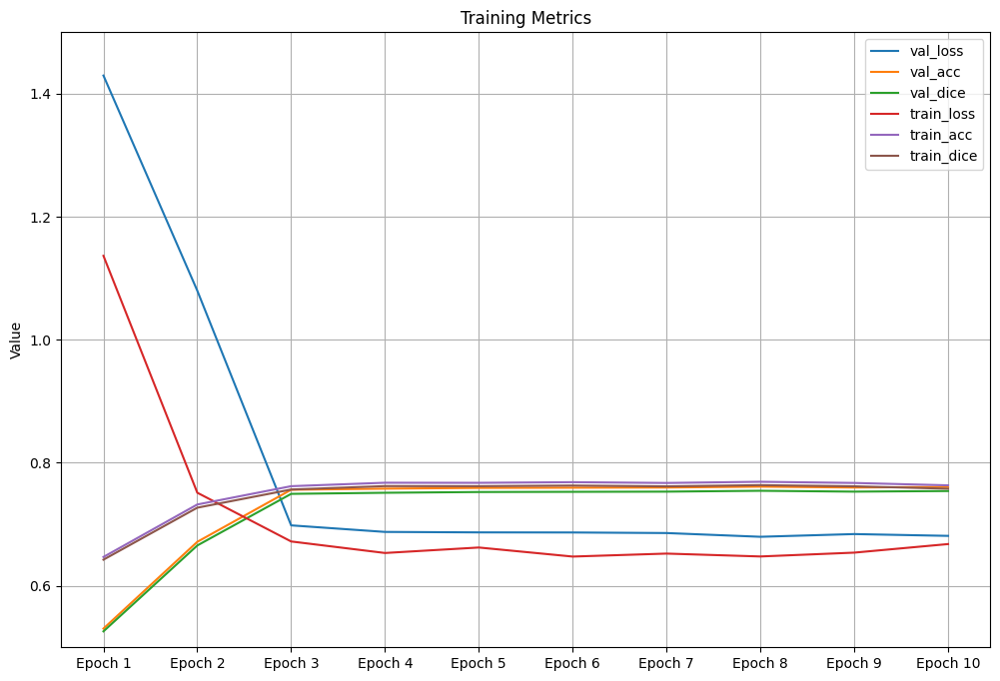

<Figure size 640x480 with 0 Axes>

In [ ]:
log_dir = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/tb_logs/my_model_lr_1e-3/lightning_logs/version_0'  # Replace with the path to your log directory
event_file = [f for f in os.listdir(log_dir) if f.startswith('events.out.tfevents')][0]
event_path = os.path.join(log_dir, event_file)

event_acc = EventAccumulator(event_path)
event_acc.Reload()

tags = event_acc.Tags()['scalars']

metrics = {}
for tag in tags:
    events = event_acc.Scalars(tag)
    steps = [e.step for e in events]
    values = [e.value for e in events]
    metrics[tag] = values[:10]

metrics_to_plot = ['val_loss', 'val_acc', 'val_dice', 'train_loss', 'train_acc', 'train_dice']

plt.figure(figsize=(12, 8))

for tag in metrics_to_plot:
    if tag in metrics:
        plt.plot(range(1, 11), metrics[tag], label=tag)
    else:
        print(f"Metric '{tag}' not found in the log file.")

plt.xlabel('')
plt.ylabel('Value')
plt.ylim(0.5, 1.5)
plt.title('Training Metrics')
plt.legend()
plt.grid(True)

epochs = [f'Epoch {i+1}' for i in range(10)]
plt.xticks(ticks=range(1, 11), labels=epochs)

plt.show()

plt.savefig('Training_Metrics.png')


Δεδομένα gt Αχαΐας

In [ ]:
gt_data_ach = rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_34SEH_ref_data.tif")

In [ ]:
type(gt_data_ach)

rasterio.io.DatasetReader

In [ ]:
gt_data_ach.meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': 0.0,
 'width': 10980,
 'height': 10980,
 'count': 1,
 'crs': CRS.from_epsg(32634),
 'transform': Affine(10.0, 0.0, 499974.9203940784,
        0.0, -10.0, 4300025.686967202)}

In [ ]:
with rasterio.open("/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_34SEH_ref_data.tif") as gt:
    band = gt.read(1)

    print(gt.meta)
    print(gt.tags())

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 10980, 'height': 10980, 'count': 1, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 499974.9203940784,
       0.0, -10.0, 4300025.686967202)}
{'algorithm_version': 'V2.0.0', 'AREA_OR_POINT': 'Area', 'copyright': 'ESA WorldCover project 2021 / Contains modified Copernicus Sentinel data (2021) processed by ESA WorldCover consortium', 'creation_time': '2022-10-21 07:35:40.236136', 'legend': '10  Tree cover\n20  Shrubland\n30  Grassland\n40  Cropland\n50  Built-up\n60  Bare/sparse vegetation\n70  Snow and ice\n80  Permanent water bodies\n90  Herbaceous wetland\n95  Mangroves\n100 Moss and lichen\n', 'license': 'CC-BY 4.0 - https://creativecommons.org/licenses/by/4.0/', 'product_crs': 'EPSG:4326', 'product_grid': '3x3 degree tiling grid', 'product_tile': 'N36E021', 'product_type': 'LandCover Map', 'product_version': 'V2.0.0', 'reference': 'https://esa-worldcover.org', 'time_end': '2021-12-31T23:59:59Z', 'time_start': 

In [ ]:
unique, counts = np.unique(band, return_counts=True)
print("Unique values and their counts (in pixels):")
print(dict(zip(unique, counts)))

Unique values and their counts (in pixels):
{0: 32940, 10: 57868482, 20: 6339032, 30: 19099534, 40: 5261929, 50: 1638732, 60: 681612, 80: 29029993, 90: 608146}


**Επεξεργασία T34SEH tile**

In [ ]:
# pansharpening
bands_to_pansharpen = ['B05.jp2', 'B06.jp2', 'B07.jp2', 'B8A.jp2', 'B11.jp2', 'B12.jp2', 'B01.jp2', 'B09.jp2', 'B10.jp2']
pan_band_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEH_20230110T042737.SAFE/GRANULE/L1C_T34SEH_A032837_20211005T092344/IMG_DATA/T34SEH_20211005T092031_B08.jp2'

for band_name in bands_to_pansharpen:
    ms_band_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEH_20230110T042737.SAFE/GRANULE/L1C_T34SEH_A032837_20211005T092344/IMG_DATA/T34SEH_20211005T092031_{band_name}'
    output_path = f'/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEH_20230110T042737.SAFE/GRANULE/L1C_T34SEH_A032837_20211005T092344/IMG_DATA/T34SEH_20211005T092031_pansharpened_{band_name}'
    pansharpen(ms_band_path, pan_band_path, output_path)

In [ ]:
#check
band_path1 = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEH_20230110T042737.SAFE/GRANULE/L1C_T34SEH_A032837_20211005T092344/IMG_DATA/T34SEH_20211005T092031_pansharpened_B09.jp2'

with rasterio.open(band_path1) as b1:
    print("Spatial resolution:", b1.res)
    print("Coordinate System:", b1.crs)

Spatial resolution: (10.0, 10.0)
Coordinate System: EPSG:32634


In [ ]:
b1.meta

{'driver': 'JP2OpenJPEG',
 'dtype': 'uint8',
 'nodata': None,
 'width': 10980,
 'height': 10980,
 'count': 1,
 'crs': CRS.from_epsg(32634),
 'transform': Affine(10.0, 0.0, 499980.0,
        0.0, -10.0, 4300020.0)}

Ίδιο μέγεθος, ίδια ανάλυση πλέον, δε χρειάζεται ευθυγράμμιση, crop κλπ.

Ένωση των 13 καναλιών σε tif.

In [ ]:
#Multiband13_tiff_T34SEH
tile_directory_base = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/S2A_MSIL1C_20211005T092031_N0500_R093_T34SEH_20230110T042737.SAFE/GRANULE/L1C_T34SEH_A032837_20211005T092344/IMG_DATA/Final'
filename_template = 'T34SEH_20211005T092031_{band}'
output_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/T34SEH_multiband13.tif'
create_multiband_tiff(output_path, tile_directory_base, filename_template)

In [ ]:
tiff_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/T34SEH_multiband13.tif'

with rasterio.open(tiff_path) as src:
    print("Number of bands:", src.count)
    print("Coordinate Reference System (CRS):", src.crs)
    print("Dimensions:", src.width, "x", src.height)
    print("Bounds:", src.bounds)
    print("Resolution:", src.res)
    print("Transform:", src.transform)
    print("Data type of the first band:", src.dtypes[0])

    for i in range(1, src.count + 1):
        band_metadata = src.tags(i)
        print(f"Metadata for band {i}: {band_metadata}")

Number of bands: 13
Coordinate Reference System (CRS): EPSG:32634
Dimensions: 10980 x 10980
Bounds: BoundingBox(left=499980.0, bottom=4190220.0, right=609780.0, top=4300020.0)
Resolution: (10.0, 10.0)
Transform: | 10.00, 0.00, 499980.00|
| 0.00,-10.00, 4300020.00|
| 0.00, 0.00, 1.00|
Data type of the first band: uint8
Metadata for band 1: {}
Metadata for band 2: {}
Metadata for band 3: {}
Metadata for band 4: {}
Metadata for band 5: {}
Metadata for band 6: {}
Metadata for band 7: {}
Metadata for band 8: {}
Metadata for band 9: {}
Metadata for band 10: {}
Metadata for band 11: {}
Metadata for band 12: {}
Metadata for band 13: {}


Προσθήκη ως 14ο το κανάλι με τα labels.

In [ ]:
data_tif_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/T34SEH_multiband13.tif'
ground_truth_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/GBDA24_ex2_34SEH_ref_data.tif'
output_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/T34SEH_multiband14.tif'
add_ground_truth_to_data(data_tif_path, ground_truth_path, output_path)

In [ ]:
file_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/T34SEH_multiband14.tif'
check_tiff_metadata(file_path)

Number of bands: 14
Metadata for the last band:
{}
CRS: EPSG:32634
Transform: | 10.00, 0.00, 499980.00|
| 0.00,-10.00, 4300020.00|
| 0.00, 0.00, 1.00|
Width: 10980 Height: 10980


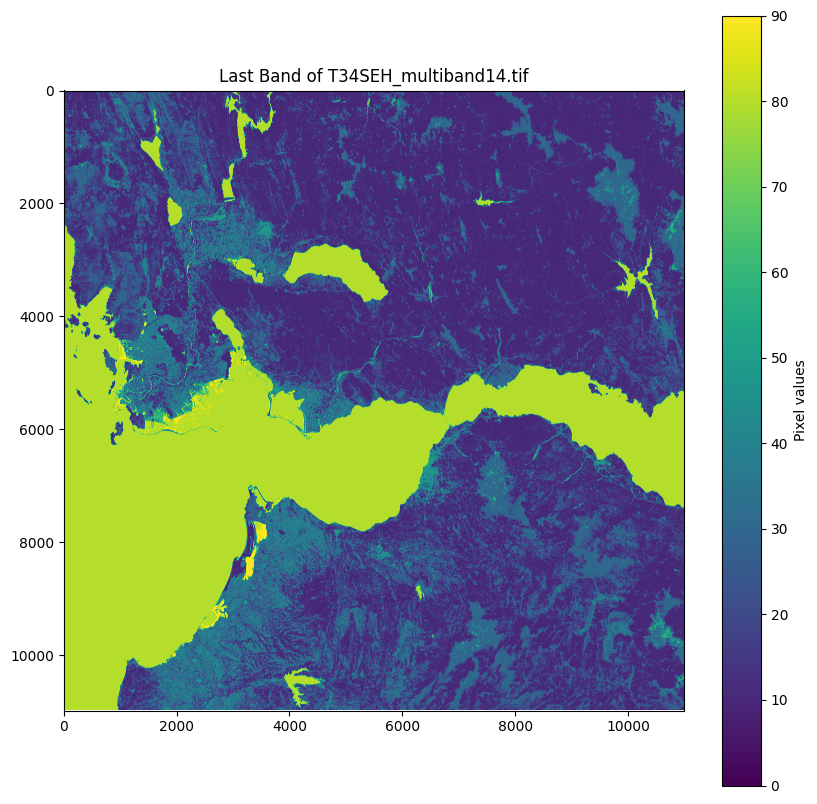

In [ ]:
tiff_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/T34SEH_multiband14.tif'
plot_last_band(tiff_path)

**Πρόβλεψη**

In [ ]:
from rasterio.windows import Window
from rasterio.transform import from_origin

In [ ]:
class SentPredict(Dataset):
    def __init__(self, image_path, patch_size=256, overlap=32, transform=None):
        super().__init__()
        self.image_path = image_path
        self.patch_size = patch_size
        self.overlap = overlap
        self.transform = transform
        self.dataset = rasterio.open(image_path)
        self.n_patches_x = (self.dataset.width - overlap) // (patch_size - overlap)
        self.n_patches_y = (self.dataset.height - overlap) // (patch_size - overlap)
        self.length = self.n_patches_x * self.n_patches_y

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        n_patches_one_dim = self.dataset.width // self.patch_size
        row = (idx // self.n_patches_x) * (self.patch_size - self.overlap)
        col = (idx % self.n_patches_x) * (self.patch_size - self.overlap)
        window = Window(col, row, self.patch_size, self.patch_size)
        features = self.dataset.read(window=window).astype(np.float32)
        features = features[:-1, :, :]
        features /= 10000

        if self.transform:
            features = self.transform(features)

        return features

new_image_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/T34SEH_multiband14.tif'
new_dset = SentPredict(new_image_path, patch_size=256, overlap=32)
new_dloader = DataLoader(new_dset, batch_size=32, shuffle=False)

checkpoint_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/checkpoints/lr_1e-3_new-epoch=07-val_acc=0.76.ckpt'

model = ResNetUNetLightning.load_from_checkpoint(checkpoint_path, n_class=9, backbone='resnet50', bands='all', linear=False, freeze_backbone=False)
model.to(device)
model.eval()

def make_predictions(dataloader, model, device):
    all_predictions = []
    model.eval()
    with torch.no_grad():
        for batch in dataloader:
            inputs = batch.to(device)
            outputs = model(inputs)
            predictions = torch.argmax(outputs, dim=1)
            all_predictions.append(predictions.cpu().numpy())
    return np.concatenate(all_predictions)

predictions = make_predictions(new_dloader, model, device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


FAIL


In [ ]:
def reconstruct_image(predictions, image_shape, patch_size, overlap):
    full_image = np.zeros(image_shape, dtype='uint8')
    patch_idx = 0

    step = patch_size - overlap
    n_patches_x = (image_shape[1] - overlap) // step
    n_patches_y = (image_shape[0] - overlap) // step

    for i in range(n_patches_y):
        for j in range(n_patches_x):
            row_start = i * step
            row_end = row_start + patch_size
            col_start = j * step
            col_end = col_start + patch_size
            full_image[row_start:row_end, col_start:col_end] = predictions[patch_idx]
            patch_idx += 1

    return full_image

with rasterio.open(new_image_path) as src:
    image_shape = (src.height, src.width)

full_predictions = reconstruct_image(predictions, image_shape, patch_size=256, overlap=32)

meta.update(count=1, dtype='uint8')

output_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/predictions.tif'
with rasterio.open(output_path, 'w', **meta) as dst:
    dst.write(full_predictions, 1)

In [ ]:
reverse_class_label_mapping = {
    0: 0,
    1: 10,
    2: 20,
    3: 30,
    4: 40,
    5: 50,
    6: 60,
    7: 80,
    8: 90
}

def map_predictions(predictions, mapping):
    reverse_map_func = np.vectorize(mapping.get)
    return reverse_map_func(predictions)

def dice_coefficient(predictions, ground_truth, ignore_index=0):
    mask = ground_truth != ignore_index
    predictions = predictions[mask]
    ground_truth = ground_truth[mask]
    num_classes = len(np.unique(ground_truth))
    dice = 0.0
    for c in np.unique(ground_truth):
        pred_c = (predictions == c).astype(np.float32)
        gt_c = (ground_truth == c).astype(np.float32)
        intersection = np.sum(pred_c * gt_c)
        union = np.sum(pred_c) + np.sum(gt_c)
        class_dice = (2. * intersection) / (union + 1e-7)
        dice += class_dice
        print(f"Class {c}: Intersection = {intersection}, Union = {union}, Dice = {class_dice}")
    return dice / num_classes

def evaluate_predictions(predictions, ground_truth_path):
    with rasterio.open(ground_truth_path) as src:
        ground_truth = src.read(14).astype(np.uint8)

    mapped_predictions = map_predictions(predictions, reverse_class_label_mapping)

    print("Unique values in predictions:", np.unique(mapped_predictions, return_counts=True))
    print("Unique values in ground truth:", np.unique(ground_truth, return_counts=True))

    mask = ground_truth != 0

    masked_predictions = mapped_predictions[mask]
    masked_ground_truth = ground_truth[mask]

    print("Unique values in masked predictions:", np.unique(masked_predictions, return_counts=True))
    print("Unique values in masked ground truth:", np.unique(masked_ground_truth, return_counts=True))

    accuracy = np.mean(masked_predictions == masked_ground_truth)
    dice_score = dice_coefficient(masked_predictions, masked_ground_truth)

    return accuracy, dice_score

def reconstruct_image(predictions, image_shape, patch_size, overlap):
    full_image = np.zeros(image_shape, dtype='uint8')
    patch_idx = 0

    step = patch_size - overlap
    n_patches_x = (image_shape[1] - overlap) // step
    n_patches_y = (image_shape[0] - overlap) // step

    for i in range(n_patches_y):
        for j in range(n_patches_x):
            row_start = i * step
            row_end = row_start + patch_size
            col_start = j * step
            col_end = col_start + patch_size
            full_image[row_start:row_end, col_start:col_end] = predictions[patch_idx]
            patch_idx += 1

    return full_image

with rasterio.open(new_image_path) as src:
    image_shape = (src.height, src.width)
    meta = src.meta

full_predictions = reconstruct_image(predictions, image_shape, patch_size=256, overlap=32)

meta.update(count=1, dtype='uint8')

output_path = '/content/drive/My Drive/Geospatial Data Analysis/Exercises/Ex2c/predictions.tif'
with rasterio.open(output_path, 'w', **meta) as dst:
    dst.write(full_predictions, 1)

accuracy, dice_score = evaluate_predictions(full_predictions, ground_truth_path)
print(f'Accuracy: {accuracy}, Dice Score: {dice_score}')

Unique values in predictions: (array([ 0, 10, 30, 40, 80]), array([ 4265744, 64818935, 18428677,  4899697, 28147347]))
Unique values in ground truth: (array([ 0, 10, 20, 30, 40, 50, 60, 80, 90], dtype=uint8), array([   43917, 57859511,  6338750, 19098128,  5261833,  1638684,
         681529, 29029912,   608136]))
Unique values in masked predictions: (array([ 0, 10, 30, 40, 80]), array([ 4264960, 64803264, 18427002,  4898894, 28122363]))
Unique values in masked ground truth: (array([10, 20, 30, 40, 50, 60, 80, 90], dtype=uint8), array([57859511,  6338750, 19098128,  5261833,  1638684,   681529,
       29029912,   608136]))
Class 10: Intersection = 52090652.0, Union = 122663072.0, Dice = 0.8493289977280196
Class 20: Intersection = 0.0, Union = 6338750.0, Dice = 0.0
Class 30: Intersection = 9771635.0, Union = 37525136.0, Dice = 0.520804774698217
Class 40: Intersection = 2346768.0, Union = 10160727.0, Dice = 0.4619291513294229
Class 50: Intersection = 0.0, Union = 1638684.0, Dice = 0.0
Cla